In [1862]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [1863]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MinMaxScaler

In [1864]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn import metrics

In [1865]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [1866]:
lead_score_df = pd.read_csv('Leads.csv')

In [1867]:
lead_score_df.head(5)

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [1868]:
lead_score_df.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [1869]:
lead_score_df.shape

(9240, 37)

In [1870]:
lead_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
Prospect ID                                      9240 non-null object
Lead Number                                      9240 non-null int64
Lead Origin                                      9240 non-null object
Lead Source                                      9204 non-null object
Do Not Email                                     9240 non-null object
Do Not Call                                      9240 non-null object
Converted                                        9240 non-null int64
TotalVisits                                      9103 non-null float64
Total Time Spent on Website                      9240 non-null int64
Page Views Per Visit                             9103 non-null float64
Last Activity                                    9137 non-null object
Country                                          6779 non-null object
Specialization                                   7802 

## 1. Identifying and processing columns with just one value i.e. no variance in data or with unique value for each row i.e. ID related columns

In [1871]:
lead_score_df.nunique()

Prospect ID                                      9240
Lead Number                                      9240
Lead Origin                                         5
Lead Source                                        21
Do Not Email                                        2
Do Not Call                                         2
Converted                                           2
TotalVisits                                        41
Total Time Spent on Website                      1731
Page Views Per Visit                              114
Last Activity                                      17
Country                                            38
Specialization                                     19
How did you hear about X Education                 10
What is your current occupation                     6
What matters most to you in choosing a course       3
Search                                              2
Magazine                                            1
Newspaper Article           

### We can see that many of the columns have just 1 value. We can remove them as there is no variance in data  and there isnt much that these columns can contribute

### Based on the above we can explore the values and remove the below attributes
> 1. Magazine
> 2. Receive More Updates About Our Courses
> 3. Update me on Supply Chain Content
> 4. Get updates on DM Content
> 5. I agree to pay the amount through cheque 

In [1872]:
singlevalue_cols = ['Magazine','Receive More Updates About Our Courses','Update me on Supply Chain Content','Get updates on DM Content',
       'I agree to pay the amount through cheque']

In [1873]:
for i in range(len(singlevalue_cols)):
    print(lead_score_df[singlevalue_cols[i]].value_counts())

No    9240
Name: Magazine, dtype: int64
No    9240
Name: Receive More Updates About Our Courses, dtype: int64
No    9240
Name: Update me on Supply Chain Content, dtype: int64
No    9240
Name: Get updates on DM Content, dtype: int64
No    9240
Name: I agree to pay the amount through cheque, dtype: int64


We can see from the above that all the columns have all rows as "No". So we can drop them

In [1874]:
# cleansing #1
lead_score_cl1_df = lead_score_df.drop(singlevalue_cols,axis=1)

In [1875]:
# cleansing #2 - Also we can remove "Prospect ID", "Lead Number" as they are ID related columns
lead_score_cl1_df.drop(['Prospect ID','Lead Number'],axis=1,inplace=True)

In [1876]:
lead_score_cl1_df.shape

(9240, 30)

Reduced number of columns by 5

## 2. Checking for Nulls Row-wise. If there are rows with more than 30% of missing data then we can remove them

In [1877]:
# Row-wise check first
len(lead_score_cl1_df.loc[lead_score_cl1_df.isnull().sum(axis=1)*100/len(lead_score_cl1_df.columns) > 30,:])

1043

There are around 1043 / 9240 rows with more than 30% of data missing. These rows coould be deleted

In [1878]:
lead_score_cl1_df.loc[lead_score_cl1_df.isnull().sum(axis=1)*100/len(lead_score_cl1_df.columns) > 30,:]

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Tags,Lead Quality,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,A free copy of Mastering The Interview,Last Notable Activity
680,API,Olark Chat,No,No,0,NaN,177,NaN,Olark Chat Conversation,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,NaN,01.High,02.Medium,17.0,15.0,No,Modified
963,API,Organic Search,No,No,0,11.0,1166,2.20,Page Visited on Website,India,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,Page Visited on Website
1123,Lead Import,Facebook,No,No,0,NaN,93,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Mumbai,02.Medium,02.Medium,14.0,15.0,No,Modified
1124,Lead Import,Facebook,No,No,0,NaN,270,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Other Cities of Maharashtra,02.Medium,02.Medium,14.0,14.0,No,Modified
1126,Lead Import,Facebook,No,No,0,NaN,214,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Mumbai,02.Medium,02.Medium,14.0,15.0,No,Modified
1127,Lead Import,Facebook,No,No,0,NaN,342,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Mumbai,02.Medium,02.Medium,14.0,15.0,No,Modified
1130,Lead Import,Facebook,No,No,0,NaN,1454,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Other Metro Cities,02.Medium,02.Medium,14.0,13.0,No,Modified
1131,Lead Import,Facebook,No,No,0,NaN,256,NaN,SMS Sent,NaN,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,Other Cities of Maharashtra,02.Medium,02.Medium,14.0,14.0,No,Modified
1363,API,Direct Traffic,No,No,0,4.0,446,1.33,Email Opened,India,NaN,NaN,NaN,NaN,No,No,No,No,No,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,Email Opened
1513,API,Google,No,No,0,6.0,481,6.00,Email Opened,India,NaN,NaN,NaN,NaN,No,No,No,No,No,No,Interested in other courses,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,Modified


In [1879]:
# cleansing #2 - Removing rows with more than 30% of missing data
lead_score_cl2_df = lead_score_cl1_df.drop(lead_score_cl1_df[lead_score_cl1_df.isnull().sum(axis=1)*100/len(lead_score_cl1_df.columns) > 30].index)

In [1880]:
lead_score_cl2_df.shape

(8197, 30)

## 3. Analyzing Values / Nulls column-wise to process / impute them as required

In [1881]:
# checking the % of missing values per column

round(lead_score_cl2_df.isnull().sum()*100/len(lead_score_cl2_df),2)

Lead Origin                                       0.00
Lead Source                                       0.41
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.55
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.55
Last Activity                                     1.23
Country                                          24.85
Specialization                                    9.33
How did you hear about X Education               14.25
What is your current occupation                  20.30
What matters most to you in choosing a course    20.36
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

Analyzing each column separately - 'Lead Source'

In [1882]:
lead_score_cl2_df['Lead Source'].value_counts()

Google               2678
Direct Traffic       2235
Olark Chat           1342
Organic Search       1037
Reference             533
Welingak Website      142
Referral Sites        123
Facebook               49
google                  5
Click2call              4
bing                    3
Live Chat               2
Social Media            2
Press_Release           2
Pay per Click Ads       1
blog                    1
welearnblog_Home        1
testone                 1
NC_EDM                  1
WeLearn                 1
Name: Lead Source, dtype: int64

In [1883]:
lead_score_cl2_df.loc[lead_score_cl2_df['Lead Source'] == 'google'] = 'Google'

In [1884]:
len(lead_score_cl2_df.loc[lead_score_cl2_df['Lead Source'].isnull()])

34

As the number of NaNs are small and it could be seen that there are few other columns also having NaNs so dropping these rows

In [1885]:
lead_score_cl3_df = lead_score_cl2_df.drop(lead_score_cl2_df.loc[lead_score_cl2_df['Lead Source'].isnull()].index)

In [1886]:
lead_score_cl3_df.shape

(8163, 30)

In [1887]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       1.49
Total Time Spent on Website                       0.00
Page Views Per Visit                              1.49
Last Activity                                     1.23
Country                                          24.55
Specialization                                    9.37
How did you hear about X Education               14.30
What is your current occupation                  20.32
What matters most to you in choosing a course    20.38
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

Analyzing each column separately - TotalVisits, Page Views Per Visit, Last Activity

In [1888]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['TotalVisits'].isnull()])

122

In [1889]:
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['TotalVisits'].isnull()].index,inplace=True)

In [1890]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Page Views Per Visit'].isnull()])

0

In [1891]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Last Activity'].isnull()])

0

In [1892]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          23.41
Specialization                                    9.51
How did you hear about X Education               14.51
What is your current occupation                  20.63
What matters most to you in choosing a course    20.69
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

In [1893]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Specialization'].isnull() &
                     lead_score_cl3_df['How did you hear about X Education'].isnull() &
                     lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull() &
                     lead_score_cl3_df['City'].isnull()])

420

There are 420 rows with 8 columns as NULL. Therefore, these can be removed

In [1894]:
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Specialization'].isnull() &
                     lead_score_cl3_df['How did you hear about X Education'].isnull() &
                     lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull() &
                     lead_score_cl3_df['City'].isnull()].index,inplace=True)

In [1895]:
lead_score_cl3_df.shape

(7621, 30)

In [1896]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          19.18
Specialization                                    4.53
How did you hear about X Education                9.80
What is your current occupation                  16.26
What matters most to you in choosing a course    16.32
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

Analyzing each column separately - Specialization

In [1897]:
lead_score_cl3_df['Specialization'].value_counts()

Select                               1845
Finance Management                    899
Human Resource Management             806
Marketing Management                  786
Operations Management                 468
Business Administration               376
IT Projects Management                333
Supply Chain Management               327
Banking, Investment And Insurance     321
Media and Advertising                 186
Travel and Tourism                    175
International Business                163
Healthcare Management                 138
Hospitality Management                102
E-COMMERCE                             98
Retail Management                      91
Rural and Agribusiness                 68
E-Business                             54
Services Excellence                    35
Google                                  5
Name: Specialization, dtype: int64

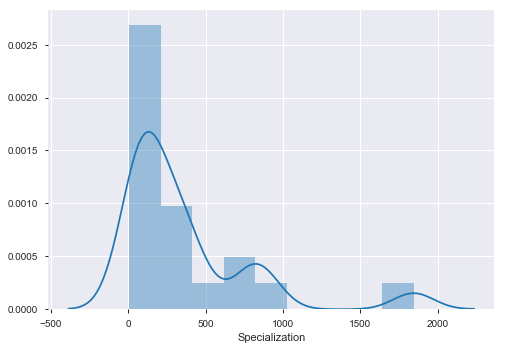

In [1898]:
sns.distplot(lead_score_cl3_df['Specialization'].value_counts())

In [1899]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Specialization'].isnull()])

345

In [1900]:
lead_score_cl3_df['Specialization'].fillna(lead_score_cl3_df['Specialization'].mode().iloc[0],inplace=True)

In [1901]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Specialization'].isnull()])

0

Analyzing each column separately - City

In [1902]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['City'].isnull()])

343

In [1903]:
lead_score_cl3_df['City'].value_counts()

Mumbai                         2979
Select                         2156
Thane & Outskirts               698
Other Cities                    629
Other Cities of Maharashtra     406
Other Metro Cities              343
Tier II Cities                   62
Google                            5
Name: City, dtype: int64

In [1904]:
# Replacing NULL values with Select, because as with Select even in NULL cases the city is not known
lead_score_cl3_df.loc[lead_score_cl3_df['City'].isnull(),'City'] = 'Select'

In [1905]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['City'].isnull()])

0

Analyzing each column separately - "How did you hear about X Education"

In [1906]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['How did you hear about X Education'].isnull()])

747

In [1907]:
lead_score_cl3_df['How did you hear about X Education'].value_counts()

Select                   4886
Online Search             807
Word Of Mouth             347
Student of SomeSchool     309
Other                     186
Multiple Sources          151
Advertisements             70
Social Media               66
Email                      25
SMS                        22
Google                      5
Name: How did you hear about X Education, dtype: int64

In [1908]:
# Again replacing NULL values with Select, because as with Select even in NULL cases the "How did you hear about X Education" is not known
lead_score_cl3_df.loc[lead_score_cl3_df['How did you hear about X Education'].isnull(),'How did you hear about X Education'] = 'Select'

In [1909]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['How did you hear about X Education'].isnull()])

0

In [1910]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          19.18
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                  16.26
What matters most to you in choosing a course    16.32
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

In [1911]:
# Dropping Asymmetrique Activity Score, Asymmetrique Profile Score as the Index columns classifying them into High, Medium, Low
# is already provided based on the scores. Therefore, these two columns will be redundant
lead_score_cl3_df.drop(['Asymmetrique Activity Score','Asymmetrique Profile Score'],axis=1,inplace=True)

In [1912]:
# Which are the rows having all NULL values for all the remaining columns
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['What matters most to you in choosing a course'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()])

6

In [1913]:
# There are 6 such rows which can be deleted
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['What matters most to you in choosing a course'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()].index,inplace=True)

In [1914]:
lead_score_cl3_df.shape

(7615, 28)

In [1915]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          19.12
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                  16.19
What matters most to you in choosing a course    16.26
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

In [1916]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['What matters most to you in choosing a course'].isnull()])

9

In [1917]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()])

1165

In [1918]:
# Seeing the above maybe we can remove the 1165 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()].index,inplace=True)

In [1919]:
lead_score_cl3_df.shape

(6450, 28)

In [1920]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          22.57
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                   1.13
What matters most to you in choosing a course     1.13
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

In [1921]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['What matters most to you in choosing a course'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()])

73

In [1922]:
# Seeing the above maybe we can remove the 1165 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['What is your current occupation'].isnull() &
                     lead_score_cl3_df['What matters most to you in choosing a course'].isnull() &
                     lead_score_cl3_df['Lead Profile'].isnull()].index,inplace=True)

In [1923]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          22.69
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

In [1924]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()])

309

In [1925]:
# Seeing the above maybe we can remove the 309 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()].index,inplace=True)

In [1926]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()])

370

In [1927]:
# Seeing the above maybe we can remove the 370 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()].index,inplace=True)

In [1928]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()])

279

In [1929]:
# Seeing the above maybe we can remove the 279 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull() &
                     lead_score_cl3_df['Lead Quality'].isnull()].index,inplace=True)

Analyzing each column separately - Tags

In [1930]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull()])

27

In [1931]:
# Seeing the above maybe we can remove the 279 
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Tags'].isnull()].index,inplace=True)

In [1932]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                          15.82
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

Analyzing each column separately - Country

In [1933]:
lead_score_cl3_df['Country'].value_counts()

India                   4344
United States             41
United Arab Emirates      38
Saudi Arabia              16
Singapore                 16
United Kingdom            11
Qatar                      8
Australia                  8
Hong Kong                  6
Oman                       5
Google                     5
Bahrain                    5
France                     5
South Africa               3
Nigeria                    3
Kuwait                     3
Uganda                     2
Philippines                2
Netherlands                2
Canada                     2
Germany                    2
Malaysia                   1
Indonesia                  1
China                      1
Tanzania                   1
Italy                      1
Sri Lanka                  1
Bangladesh                 1
Ghana                      1
Sweden                     1
Vietnam                    1
Kenya                      1
Denmark                    1
Name: Country, dtype: int64

In [1934]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Country'].isnull()])

853

In [1935]:
# Imputing with value of India as it is clearly has the highest value by a long margin
lead_score_cl3_df['Country'].fillna(lead_score_cl3_df['Country'].mode().iloc[0],inplace=True)

Analyzing each column separately - Lead Quality

In [1936]:
lead_score_cl3_df['Lead Quality'].value_counts()

Might be             1509
Not Sure             1073
Worst                 601
High in Relevance     590
Low in Relevance      554
Google                  5
Name: Lead Quality, dtype: int64

In [1937]:
#lead_score_cl3_df["Lead Quality"].fillna(lambda x: random.choice(lead_score_cl3_df[~lead_score_cl3_df['Lead Quality'].isnull()]['Lead Quality']), inplace =True)

#lead_score_cl3_df["Lead Quality"].apply(lambda x: x.fillna(random.choice(lead_score_cl3_df[~lead_score_cl3_df['Lead Quality'].isnull()]['Lead Quality']),axis=1))
unique_val = lead_score_cl3_df[~lead_score_cl3_df["Lead Quality"].isnull()]['Lead Quality'].unique()

In [1938]:
print(unique_val)

['Low in Relevance' 'Might be' 'Not Sure' 'Worst' 'High in Relevance'
 'Google']


In [1939]:
lead_score_cl3_df["Lead Quality"] = lead_score_cl3_df["Lead Quality"].fillna(0)

lead_score_cl3_df["Lead Quality"] = lead_score_cl3_df.apply(lambda row: random.choice(unique_val) if row["Lead Quality"] == 0 else row["Lead Quality"],axis=1)

In [1940]:
lead_score_cl3_df['Lead Quality'].value_counts()

Might be             1670
Not Sure             1257
Worst                 773
High in Relevance     771
Low in Relevance      727
Google                194
Name: Lead Quality, dtype: int64

In [1941]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                       0.00
Lead Source                                       0.00
Do Not Email                                      0.00
Do Not Call                                       0.00
Converted                                         0.00
TotalVisits                                       0.00
Total Time Spent on Website                       0.00
Page Views Per Visit                              0.00
Last Activity                                     0.00
Country                                           0.00
Specialization                                    0.00
How did you hear about X Education                0.00
What is your current occupation                   0.00
What matters most to you in choosing a course     0.00
Search                                            0.00
Newspaper Article                                 0.00
X Education Forums                                0.00
Newspaper                                         0.00
Digital Ad

Analyzing each column separately - Asymmetrique Columns

In [1942]:
print(lead_score_cl3_df['Asymmetrique Activity Index'].value_counts())
print(lead_score_cl3_df['Asymmetrique Profile Index'].value_counts())

02.Medium    2415
01.High       300
03.Low        233
Google          5
Name: Asymmetrique Activity Index, dtype: int64
01.High      1635
02.Medium    1295
03.Low         18
Google          5
Name: Asymmetrique Profile Index, dtype: int64


In [1943]:
len(lead_score_cl3_df.loc[lead_score_cl3_df['Asymmetrique Activity Index'] == 'Google'])

5

In [1944]:
lead_score_cl3_df.drop(lead_score_cl3_df.loc[lead_score_cl3_df['Asymmetrique Activity Index'] == 'Google'].index,inplace=True)

In [1945]:
print(len(lead_score_cl3_df.loc[lead_score_cl3_df['Asymmetrique Activity Index'].isnull()]))
print(len(lead_score_cl3_df.loc[lead_score_cl3_df['Asymmetrique Profile Index'].isnull()]))

2439
2439


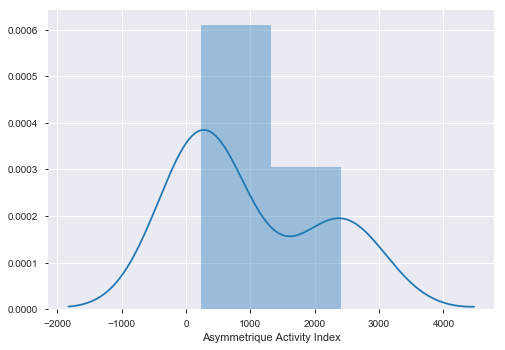

In [1946]:
sns.distplot(lead_score_cl3_df['Asymmetrique Activity Index'].value_counts())

In [1947]:
lead_score_cl3_df['Asymmetrique Activity Index'] = lead_score_cl3_df['Asymmetrique Activity Index'].map({'02.Medium': 2, '01.High': 0, '03.Low':3})

In [1948]:
lead_score_cl3_df['Asymmetrique Profile Index'] = lead_score_cl3_df['Asymmetrique Profile Index'].map({'02.Medium': 2, '01.High': 0, '03.Low':3})

In [1949]:
unique_val2 = lead_score_cl3_df[~lead_score_cl3_df["Asymmetrique Activity Index"].isnull()]['Asymmetrique Activity Index'].unique()

In [1950]:
unique_val2

array([2., 0., 3.])

In [1951]:
# As there are lots of missing values, replacing all of them by just mean/median/mode could cause imbalance. Therefore, distributing them randomly

lead_score_cl3_df["Asymmetrique Activity Index"] = lead_score_cl3_df["Asymmetrique Activity Index"].fillna(0)

lead_score_cl3_df["Asymmetrique Activity Index"] = lead_score_cl3_df.apply(lambda row: random.choice(unique_val2) if row["Asymmetrique Activity Index"] == 0 else row["Asymmetrique Activity Index"],axis=1)

In [1952]:
unique_val3 = lead_score_cl3_df[~lead_score_cl3_df["Asymmetrique Profile Index"].isnull()]['Asymmetrique Profile Index'].unique()

In [1953]:
unique_val3

array([2., 0., 3.])

In [1954]:
lead_score_cl3_df["Asymmetrique Profile Index"] = lead_score_cl3_df["Asymmetrique Profile Index"].fillna(0)

lead_score_cl3_df["Asymmetrique Profile Index"] = lead_score_cl3_df.apply(lambda row: random.choice(unique_val3) if row["Asymmetrique Profile Index"] == 0 else row["Asymmetrique Profile Index"],axis=1)

In [1955]:
round(lead_score_cl3_df.isnull().sum()*100/len(lead_score_cl3_df),2)

Lead Origin                                      0.0
Lead Source                                      0.0
Do Not Email                                     0.0
Do Not Call                                      0.0
Converted                                        0.0
TotalVisits                                      0.0
Total Time Spent on Website                      0.0
Page Views Per Visit                             0.0
Last Activity                                    0.0
Country                                          0.0
Specialization                                   0.0
How did you hear about X Education               0.0
What is your current occupation                  0.0
What matters most to you in choosing a course    0.0
Search                                           0.0
Newspaper Article                                0.0
X Education Forums                               0.0
Newspaper                                        0.0
Digital Advertisement                         

In [1956]:
lead_score_cl3_df.shape

(5387, 28)

In [1957]:
for col in lead_score_cl3_df.columns:
    print(lead_score_cl3_df[col].value_counts())

Landing Page Submission    3451
API                        1495
Lead Add Form               429
Lead Import                  12
Name: Lead Origin, dtype: int64
Google               1826
Direct Traffic       1783
Organic Search        800
Olark Chat            462
Reference             406
Referral Sites         67
Welingak Website       17
Facebook               13
Click2call              3
Social Media            2
Live Chat               2
bing                    2
Press_Release           1
WeLearn                 1
Pay per Click Ads       1
testone                 1
Name: Lead Source, dtype: int64
No     5025
Yes     362
Name: Do Not Email, dtype: int64
No     5385
Yes       2
Name: Do Not Call, dtype: int64
0    2869
1    2518
Name: Converted, dtype: int64
2.0      1104
3.0       848
0.0       792
4.0       768
5.0       534
6.0       304
1.0       240
7.0       212
8.0       154
9.0       119
10.0       69
11.0       62
13.0       37
12.0       29
14.0       25
16.0       12
15.0 

In [1958]:
# Do not email flag
email_fl = pd.get_dummies(lead_score_cl3_df['Do Not Email'], drop_first = True)
email_fl = email_fl.rename({'Yes':'email_Yes'},axis=1)
lead_score_cl4_df = pd.concat([lead_score_cl3_df,email_fl],axis=1)

In [1959]:
# Do not call flag
call_fl = pd.get_dummies(lead_score_cl4_df['Do Not Call'], drop_first = True)
call_fl = call_fl.rename({'Yes':'call_Yes'},axis=1)
lead_score_cl4_df = pd.concat([lead_score_cl4_df,call_fl],axis=1)

In [1960]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Do Not Email','Do Not Call'],axis=1)

In [1961]:
# Lead Origin
lead_origin = pd.get_dummies(lead_score_cl4_df['Lead Origin'], drop_first = True)
lead_origin = lead_origin.add_prefix('Lead_Origin_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,lead_origin],axis=1)

In [1962]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Lead Origin'],axis=1)

In [1963]:
lead_score_cl4_df['TotalVisits'] = pd.to_numeric(lead_score_cl4_df['TotalVisits'])
lead_score_cl4_df['Total Time Spent on Website'] = pd.to_numeric(lead_score_cl4_df['Total Time Spent on Website'])
lead_score_cl4_df['Page Views Per Visit'] = pd.to_numeric(lead_score_cl4_df['Page Views Per Visit'])

In [1964]:
# A free copy of Mastering The Interview: This column has balanced data between Yes and No
free_copy = pd.get_dummies(lead_score_cl4_df['A free copy of Mastering The Interview'], drop_first = True)
free_copy = free_copy.add_prefix('Free_Copy_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,free_copy],axis=1)

In [1965]:
lead_score_cl4_df = lead_score_cl4_df.drop(['A free copy of Mastering The Interview'],axis=1)

In [1966]:
# Last Notable Activity
lead_score_cl4_df['Last Notable Activity'].value_counts()

Email Opened                    1709
Modified                        1680
SMS Sent                        1562
Page Visited on Website          194
Email Link Clicked                94
Olark Chat Conversation           47
Email Bounced                     34
Unsubscribed                      27
Unreachable                       22
Had a Phone Conversation          13
Email Marked Spam                  2
Approached upfront                 1
Email Received                     1
View in browser link Clicked       1
Name: Last Notable Activity, dtype: int64

In [1967]:
lead_score_cl4_df['Last Activity'].value_counts()

Email Opened                    2072
SMS Sent                        1844
Page Visited on Website          398
Olark Chat Conversation          281
Converted to Lead                276
Email Link Clicked               152
Email Bounced                    147
Form Submitted on Website         75
Unreachable                       70
Unsubscribed                      36
Had a Phone Conversation          23
Approached upfront                 5
View in browser link Clicked       3
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Name: Last Activity, dtype: int64

Comparing the above two we can see that both "Last Notable Activity" and "Last Activity" are trying to represent the same data.
However, it is mentioned that "Last Notable Activity" is only that of the student and "Last Activity" is of any customer (student/unemployed/employed). But "Last Notable Activity" has as many entries which looks incorrect
Therefore, "Last Notable Activity" looks redundant and can be removed

In [1968]:
# Last Notable Activity: 
la_df = pd.get_dummies(lead_score_cl4_df['Last Activity'], drop_first = True)
la_df = la_df.add_prefix('LA_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,la_df],axis=1)

In [1969]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Last Activity'],axis=1)
lead_score_cl4_df = lead_score_cl4_df.drop(['Last Notable Activity'],axis=1)

In [1970]:
lead_score_cl4_df['City'].value_counts()

Mumbai                         2299
Select                         1403
Thane & Outskirts               561
Other Cities                    487
Other Cities of Maharashtra     312
Other Metro Cities              272
Tier II Cities                   53
Name: City, dtype: int64

In [1971]:
# City
city_df = pd.get_dummies(lead_score_cl4_df['City'], drop_first = True)
city_df = city_df.add_prefix('city_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,city_df],axis=1)

In [1972]:
lead_score_cl4_df = lead_score_cl4_df.drop(['City'],axis=1)

In [1973]:
# Lead Profile
lead_score_cl4_df['Lead Profile'].value_counts()

Select                         3125
Potential Lead                 1504
Other Leads                     478
Student of SomeSchool           239
Lateral Student                  21
Dual Specialization Student      20
Name: Lead Profile, dtype: int64

In [1974]:
# Lead Profile
lead_profile_df = pd.get_dummies(lead_score_cl4_df['Lead Profile'], drop_first = True)
lead_profile_df = lead_profile_df.add_prefix('LP_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,lead_profile_df],axis=1)

In [1975]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Lead Profile'],axis=1)

In [1976]:
# Lead Quality
lead_score_cl4_df['Lead Quality'].value_counts()

Might be             1670
Not Sure             1257
Worst                 773
High in Relevance     771
Low in Relevance      727
Google                189
Name: Lead Quality, dtype: int64

"Might be" and "Not Sure" seem to be the same. We can merge the both. Also "Google" seems to be invaalid here

In [1977]:
# Merging the values
# lead_score_cl4_df.loc[lead_score_cl4_df['Lead Quality'] == 'Might be',['Lead Quality']] = 'Not Sure'

In [1978]:
lead_quality_df = pd.get_dummies(lead_score_cl4_df['Lead Quality'], drop_first = True)
lead_quality_df = lead_quality_df.add_prefix('LQ_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,lead_quality_df],axis=1)

In [1979]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Lead Quality'],axis=1)

In [1980]:
# Tags
lead_score_cl4_df['Tags'].value_counts()

Will revert after reading the email                  2008
Ringing                                              1096
Already a student                                     431
Interested in other courses                           425
Closed by Horizzon                                    276
switched off                                          233
Busy                                                  182
Not doing further education                           140
Lost to EINS                                          109
Interested  in full time MBA                          108
Graduation in progress                                102
invalid number                                         77
Diploma holder (Not Eligible)                          54
wrong number given                                     45
opp hangup                                             31
number not provided                                    24
in touch with EINS                                     10
Lost to Others

In [1981]:
tags_df = pd.get_dummies(lead_score_cl4_df['Tags'], drop_first = True)
tags_df = tags_df.add_prefix('Tags_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,tags_df],axis=1)

In [1982]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Tags'],axis=1)

In [1983]:
print(lead_score_cl4_df['Search'].value_counts())
print(lead_score_cl4_df['Newspaper Article'].value_counts())
print(lead_score_cl4_df['X Education Forums'].value_counts())
print(lead_score_cl4_df['Newspaper'].value_counts())
print(lead_score_cl4_df['Digital Advertisement'].value_counts())
print(lead_score_cl4_df['Through Recommendations'].value_counts())

No     5377
Yes      10
Name: Search, dtype: int64
No     5386
Yes       1
Name: Newspaper Article, dtype: int64
No    5387
Name: X Education Forums, dtype: int64
No     5386
Yes       1
Name: Newspaper, dtype: int64
No     5384
Yes       3
Name: Digital Advertisement, dtype: int64
No     5381
Yes       6
Name: Through Recommendations, dtype: int64


All the above are clearly unbalanced towards "No". Therefore, can be ignored

In [1984]:
lead_score_cl4_df.drop(['Search'],axis=1,inplace=True)
lead_score_cl4_df.drop(['Newspaper Article'],axis=1,inplace=True)
lead_score_cl4_df.drop(['X Education Forums'],axis=1,inplace=True)
lead_score_cl4_df.drop(['Newspaper'],axis=1,inplace=True)
lead_score_cl4_df.drop(['Digital Advertisement'],axis=1,inplace=True)
lead_score_cl4_df.drop(['Through Recommendations'],axis=1,inplace=True)

In [1985]:
print(lead_score_cl4_df['How did you hear about X Education'].value_counts())
print(lead_score_cl4_df['What is your current occupation'].value_counts())
print(lead_score_cl4_df['What matters most to you in choosing a course'].value_counts())

Select                   3987
Online Search             570
Word Of Mouth             233
Student of SomeSchool     225
Other                     134
Multiple Sources          107
Social Media               50
Advertisements             48
Email                      21
SMS                        12
Name: How did you hear about X Education, dtype: int64
Unemployed              4500
Working Professional     664
Student                  193
Other                     15
Housewife                  9
Businessman                6
Name: What is your current occupation, dtype: int64
Better Career Prospects      5385
Flexibility & Convenience       1
Other                           1
Name: What matters most to you in choosing a course, dtype: int64


In [1986]:
# Dropping "What matters most to you in choosing a course" as it is clearly unbalanced
lead_score_cl4_df.drop(['What matters most to you in choosing a course'],axis=1,inplace=True)

In [1987]:
# How did you hear about X Education:
hear_edu_df = pd.get_dummies(lead_score_cl4_df['How did you hear about X Education'], drop_first = True)
hear_edu_df = hear_edu_df.add_prefix('hear_edu_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,hear_edu_df],axis=1)

In [1988]:
lead_score_cl4_df = lead_score_cl4_df.drop(['How did you hear about X Education'],axis=1)

In [1989]:
# 'What is your current occupation':
curr_ocu_df = pd.get_dummies(lead_score_cl4_df['What is your current occupation'], drop_first = True)
curr_ocu_df = curr_ocu_df.add_prefix('curr_ocu_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,curr_ocu_df],axis=1)

In [1990]:
lead_score_cl4_df = lead_score_cl4_df.drop(['What is your current occupation'],axis=1)

In [1991]:
lead_score_cl4_df['Country'].value_counts()

India                   5197
United States             41
United Arab Emirates      38
Saudi Arabia              16
Singapore                 16
United Kingdom            11
Qatar                      8
Australia                  8
Hong Kong                  6
France                     5
Oman                       5
Bahrain                    5
South Africa               3
Nigeria                    3
Kuwait                     3
Canada                     2
Uganda                     2
Germany                    2
Netherlands                2
Philippines                2
Kenya                      1
Vietnam                    1
Ghana                      1
Bangladesh                 1
Italy                      1
Denmark                    1
China                      1
Indonesia                  1
Malaysia                   1
Sweden                     1
Sri Lanka                  1
Tanzania                   1
Name: Country, dtype: int64

In [1992]:
# 'Country':
coun_df = pd.get_dummies(lead_score_cl4_df['Country'], drop_first = True)
coun_df = coun_df.add_prefix('COUN_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,coun_df],axis=1)

In [1993]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Country'],axis=1)

In [1994]:
# Specialization
lead_score_cl4_df['Specialization'].value_counts()

Select                               1088
Finance Management                    711
Marketing Management                  634
Human Resource Management             631
Operations Management                 368
Business Administration               293
Supply Chain Management               262
IT Projects Management                260
Banking, Investment And Insurance     257
Media and Advertising                 153
Travel and Tourism                    141
International Business                127
Healthcare Management                 118
Hospitality Management                 82
Retail Management                      73
E-COMMERCE                             73
Rural and Agribusiness                 55
E-Business                             39
Services Excellence                    22
Name: Specialization, dtype: int64

In [1995]:
# 'Specialization':
spe_df = pd.get_dummies(lead_score_cl4_df['Specialization'], drop_first = True)
spe_df = spe_df.add_prefix('SPE_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,spe_df],axis=1)

In [1996]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Specialization'],axis=1)

In [1997]:
# Lead Source
lead_score_cl4_df['Lead Source'].value_counts()

Google               1826
Direct Traffic       1783
Organic Search        800
Olark Chat            462
Reference             406
Referral Sites         67
Welingak Website       17
Facebook               13
Click2call              3
Social Media            2
Live Chat               2
bing                    2
Press_Release           1
WeLearn                 1
Pay per Click Ads       1
testone                 1
Name: Lead Source, dtype: int64

In [1998]:
# 'Lead Source':
ls_df = pd.get_dummies(lead_score_cl4_df['Lead Source'], drop_first = True)
ls_df = ls_df.add_prefix('LS_')
lead_score_cl4_df = pd.concat([lead_score_cl4_df,ls_df],axis=1)

In [1999]:
lead_score_cl4_df = lead_score_cl4_df.drop(['Lead Source'],axis=1)

In [2000]:
lead_score_cl4_df['Converted'] = lead_score_cl4_df['Converted'].astype('int')

In [2001]:
lead_score_cl4_df.shape

(5387, 146)

In [2002]:
lead_score_cl4_df.head(5)

,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Index,Asymmetrique Profile Index,email_Yes,call_Yes,Lead_Origin_Landing Page Submission,Lead_Origin_Lead Add Form,Lead_Origin_Lead Import,Free_Copy_Yes,LA_Converted to Lead,LA_Email Bounced,LA_Email Link Clicked,LA_Email Marked Spam,LA_Email Opened,LA_Email Received,LA_Form Submitted on Website,LA_Had a Phone Conversation,LA_Olark Chat Conversation,LA_Page Visited on Website,LA_SMS Sent,LA_Unreachable,LA_Unsubscribed,LA_View in browser link Clicked,LA_Visited Booth in Tradeshow,city_Other Cities,city_Other Cities of Maharashtra,city_Other Metro Cities,city_Select,city_Thane & Outskirts,city_Tier II Cities,LP_Lateral Student,LP_Other Leads,LP_Potential Lead,LP_Select,LP_Student of SomeSchool,LQ_High in Relevance,LQ_Low in Relevance,LQ_Might be,LQ_Not Sure,LQ_Worst,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,hear_edu_Email,hear_edu_Multiple Sources,hear_edu_Online Search,hear_edu_Other,hear_edu_SMS,hear_edu_Select,hear_edu_Social Media,hear_edu_Student of SomeSchool,hear_edu_Word Of Mouth,curr_ocu_Housewife,curr_ocu_Other,curr_ocu_Student,curr_ocu_Unemployed,curr_ocu_Working Professional,COUN_Bahrain,COUN_Bangladesh,COUN_Canada,COUN_China,COUN_Denmark,COUN_France,COUN_Germany,COUN_Ghana,COUN_Hong Kong,COUN_India,COUN_Indonesia,COUN_Italy,COUN_Kenya,COUN_Kuwait,COUN_Malaysia,COUN_Netherlands,COUN_Nigeria,COUN_Oman,COUN_Philippines,COUN_Qatar,COUN_Saudi Arabia,COUN_Singapore,COUN_South Africa,COUN_Sri Lanka,COUN_Sweden,COUN_Tanzania,COUN_Uganda,COUN_United Arab Emirates,COUN_United Kingdom,COUN_United States,COUN_Vietnam,SPE_Business Administration,SPE_E-Business,SPE_E-COMMERCE,SPE_Finance Management,SPE_Healthcare Management,SPE_Hospitality Management,SPE_Human Resource Management,SPE_IT Projects Management,SPE_International Business,SPE_Marketing Management,SPE_Media and Advertising,SPE_Operations Management,SPE_Retail Management,SPE_Rural and Agribusiness,SPE_Select,SPE_Services Excellence,SPE_Supply Chain Management,SPE_Travel and Tourism,LS_Direct Traffic,LS_Facebook,LS_Google,LS_Live Chat,LS_Olark Chat,LS_Organic Search,LS_Pay per Click Ads,LS_Press_Release,LS_Reference,LS_Referral Sites,LS_Social Media,LS_WeLearn,LS_Welingak Website,LS_bing,LS_testone
0,0,0.0,0,0.0,2.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,5.0,674,2.5,2.0,2.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,1,2.0,1532,2.0,2.0,3.0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1.0,305,1.0,2.0,3.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [2003]:
num_cols = ['TotalVisits','Total Time Spent on Website','Page Views Per Visit']
lead_score_cl5_df = lead_score_cl4_df.drop(num_cols,axis=1)

In [2004]:
for col in lead_score_cl5_df.columns:
    print(lead_score_cl5_df[col].value_counts())

0    2869
1    2518
Name: Converted, dtype: int64
2.0    3307
3.0    1170
0.0     910
Name: Asymmetrique Activity Index, dtype: int64
2.0    2636
3.0    1397
0.0    1354
Name: Asymmetrique Profile Index, dtype: int64
0    5025
1     362
Name: email_Yes, dtype: int64
0    5385
1       2
Name: call_Yes, dtype: int64
1    3451
0    1936
Name: Lead_Origin_Landing Page Submission, dtype: int64
0    4958
1     429
Name: Lead_Origin_Lead Add Form, dtype: int64
0    5375
1      12
Name: Lead_Origin_Lead Import, dtype: int64
0    3324
1    2063
Name: Free_Copy_Yes, dtype: int64
0    5111
1     276
Name: LA_Converted to Lead, dtype: int64
0    5240
1     147
Name: LA_Email Bounced, dtype: int64
0    5235
1     152
Name: LA_Email Link Clicked, dtype: int64
0    5385
1       2
Name: LA_Email Marked Spam, dtype: int64
0    3315
1    2072
Name: LA_Email Opened, dtype: int64
0    5385
1       2
Name: LA_Email Received, dtype: int64
0    5312
1      75
Name: LA_Form Submitted on Website, dtype: int64


## Splitting the Data into Training and Testing Sets

In [2005]:
# Putting feature variable to X
X = lead_score_cl4_df.drop(['Converted'], axis=1)

X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Index,Asymmetrique Profile Index,email_Yes,call_Yes,Lead_Origin_Landing Page Submission,Lead_Origin_Lead Add Form,Lead_Origin_Lead Import,Free_Copy_Yes,LA_Converted to Lead,LA_Email Bounced,LA_Email Link Clicked,LA_Email Marked Spam,LA_Email Opened,LA_Email Received,LA_Form Submitted on Website,LA_Had a Phone Conversation,LA_Olark Chat Conversation,LA_Page Visited on Website,LA_SMS Sent,LA_Unreachable,LA_Unsubscribed,LA_View in browser link Clicked,LA_Visited Booth in Tradeshow,city_Other Cities,city_Other Cities of Maharashtra,city_Other Metro Cities,city_Select,city_Thane & Outskirts,city_Tier II Cities,LP_Lateral Student,LP_Other Leads,LP_Potential Lead,LP_Select,LP_Student of SomeSchool,LQ_High in Relevance,LQ_Low in Relevance,LQ_Might be,LQ_Not Sure,LQ_Worst,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,hear_edu_Email,hear_edu_Multiple Sources,hear_edu_Online Search,hear_edu_Other,hear_edu_SMS,hear_edu_Select,hear_edu_Social Media,hear_edu_Student of SomeSchool,hear_edu_Word Of Mouth,curr_ocu_Housewife,curr_ocu_Other,curr_ocu_Student,curr_ocu_Unemployed,curr_ocu_Working Professional,COUN_Bahrain,COUN_Bangladesh,COUN_Canada,COUN_China,COUN_Denmark,COUN_France,COUN_Germany,COUN_Ghana,COUN_Hong Kong,COUN_India,COUN_Indonesia,COUN_Italy,COUN_Kenya,COUN_Kuwait,COUN_Malaysia,COUN_Netherlands,COUN_Nigeria,COUN_Oman,COUN_Philippines,COUN_Qatar,COUN_Saudi Arabia,COUN_Singapore,COUN_South Africa,COUN_Sri Lanka,COUN_Sweden,COUN_Tanzania,COUN_Uganda,COUN_United Arab Emirates,COUN_United Kingdom,COUN_United States,COUN_Vietnam,SPE_Business Administration,SPE_E-Business,SPE_E-COMMERCE,SPE_Finance Management,SPE_Healthcare Management,SPE_Hospitality Management,SPE_Human Resource Management,SPE_IT Projects Management,SPE_International Business,SPE_Marketing Management,SPE_Media and Advertising,SPE_Operations Management,SPE_Retail Management,SPE_Rural and Agribusiness,SPE_Select,SPE_Services Excellence,SPE_Supply Chain Management,SPE_Travel and Tourism,LS_Direct Traffic,LS_Facebook,LS_Google,LS_Live Chat,LS_Olark Chat,LS_Organic Search,LS_Pay per Click Ads,LS_Press_Release,LS_Reference,LS_Referral Sites,LS_Social Media,LS_WeLearn,LS_Welingak Website,LS_bing,LS_testone
0,0.0,0,0.0,2.0,2.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,5.0,674,2.5,2.0,2.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
2,2.0,1532,2.0,2.0,3.0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.0,305,1.0,2.0,3.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,

In [2006]:
# Putting response variable to y
y = lead_score_cl4_df['Converted']

y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int32

In [2007]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

## Rescaling the Features

In [2008]:
scaler = MinMaxScaler()

In [2009]:
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])

X_train[num_cols].head(5)

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
316,0.040541,0.087588,0.200000
7452,0.081081,0.351232,0.400000
56,0.175676,0.191901,0.866667
2574,0.054054,0.721831,0.266667
6490,0.013514,0.014085,0.066667


## Looking at Correlations

In [2010]:
lead_score_cl4_df.corr().abs().unstack().sort_values(ascending=False)

LS_testone                                              LS_testone                                                1.000000
hear_edu_SMS                                            hear_edu_SMS                                              1.000000
COUN_Indonesia                                          COUN_Indonesia                                            1.000000
COUN_Italy                                              COUN_Italy                                                1.000000
COUN_Kenya                                              COUN_Kenya                                                1.000000
COUN_Kuwait                                             COUN_Kuwait                                               1.000000
COUN_Malaysia                                           COUN_Malaysia                                             1.000000
COUN_Netherlands                                        COUN_Netherlands                                          1.000000
COUN_Nigeria    

### Dropping highly correlated dummy variables

In [2011]:
# Dropping correlated variables with Correlation score > 0.5

X_train = X_train.drop(['Lead_Origin_Lead Add Form','Lead_Origin_Lead Import','curr_ocu_Unemployed',
                    'Tags_Will revert after reading the email','Lead_Origin_Landing Page Submission',
                    'LP_Select', 'SPE_Select', 'LA_Email Bounced','hear_edu_Select',
                    'LS_Direct Traffic','LA_SMS Sent','LP_Student of SomeSchool'], 1)
#X_test = X_test.drop(['Lead_Origin_Lead Add Form','Lead_Origin_Lead Import','curr_ocu_Unemployed',
                  #  'Tags_Will revert after reading the email','Lead_Origin_Landing Page Submission',
                  #  'LP_Select', 'SPE_Select', 'LA_Email Bounced','hear_edu_Select',
                  # 'LS_Direct Traffic','LA_SMS Sent','LP_Student of SomeSchool'], 1)

In [2012]:
X_train.corr().abs().unstack().sort_values(ascending=False)

LS_bing                                                 LS_bing                                                   1.000000
COUN_United Arab Emirates                               COUN_United Arab Emirates                                 1.000000
COUN_South Africa                                       COUN_South Africa                                         1.000000
COUN_Singapore                                          COUN_Singapore                                            1.000000
COUN_Saudi Arabia                                       COUN_Saudi Arabia                                         1.000000
COUN_Qatar                                              COUN_Qatar                                                1.000000
COUN_Philippines                                        COUN_Philippines                                          1.000000
COUN_Oman                                               COUN_Oman                                                 1.000000
COUN_Nigeria    

In [2013]:
X_train = X_train.drop(['Page Views Per Visit'], 1)
#X_test = X_test.drop(['Page Views Per Visit'], 1)

In [2014]:
X_train.corr().abs().unstack().sort_values(ascending=False)

LS_bing                                                 LS_bing                                                   1.000000
hear_edu_Other                                          hear_edu_Other                                            1.000000
COUN_Uganda                                             COUN_Uganda                                               1.000000
COUN_South Africa                                       COUN_South Africa                                         1.000000
COUN_Singapore                                          COUN_Singapore                                            1.000000
COUN_Saudi Arabia                                       COUN_Saudi Arabia                                         1.000000
COUN_Qatar                                              COUN_Qatar                                                1.000000
COUN_Philippines                                        COUN_Philippines                                          1.000000
COUN_Oman       

Apart from the same variable correlations all other variable pairs have correlation score of < 0.5

## Model Building

### Feature Selection Using RFE¶


In [2015]:
logreg = LogisticRegression()

In [2016]:
rfe = RFE(logreg, 30)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)

In [2017]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('TotalVisits', False, 11),
 ('Total Time Spent on Website', True, 1),
 ('Asymmetrique Activity Index', False, 81),
 ('Asymmetrique Profile Index', False, 92),
 ('email_Yes', True, 1),
 ('call_Yes', False, 56),
 ('Free_Copy_Yes', False, 34),
 ('LA_Converted to Lead', True, 1),
 ('LA_Email Link Clicked', False, 8),
 ('LA_Email Marked Spam', False, 76),
 ('LA_Email Opened', False, 4),
 ('LA_Email Received', False, 86),
 ('LA_Form Submitted on Website', False, 2),
 ('LA_Had a Phone Conversation', False, 41),
 ('LA_Olark Chat Conversation', True, 1),
 ('LA_Page Visited on Website', False, 3),
 ('LA_Unreachable', False, 28),
 ('LA_Unsubscribed', False, 42),
 ('LA_View in browser link Clicked', False, 17),
 ('LA_Visited Booth in Tradeshow', False, 59),
 ('city_Other Cities', False, 70),
 ('city_Other Cities of Maharashtra', False, 24),
 ('city_Other Metro Cities', False, 78),
 ('city_Select', False, 51),
 ('city_Thane & Outskirts', False, 52),
 ('city_Tier II Cities', False, 43),
 ('LP_Late

In [2018]:
rfe_retained_col = X_train.columns[rfe.support_]

In [2019]:
len(rfe_retained_col)

30

### Assessing the model with StatsModels

In [2020]:
X_train_sm = sm.add_constant(X_train[rfe_retained_col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3770
Model:                            GLM   Df Residuals:                     3739
Model Family:                Binomial   Df Model:                           30
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -640.35
Date:                Mon, 26 Aug 2019   Deviance:                       1280.7
Time:                        14:06:16   Pearson chi2:                 8.10e+03
No. Iterations:                    24   Covariance Type:             nonrobust
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -2.7064      0.630     -4.297      0.000      -3.941      -1.472
Total Time Spent on Website                                3.4585      0.324     10.668      0.000       2.823       4.094
email_Yes                                                 -1.2200      0.347     -3.518      0.000      -1.900      -0.540
LA_Converted to Lead                                      -1.6596      0.374     -4.441      0.000      -2.392      -0.927
LA_Olark Chat Conversation                                -1.4721      0.365     -4.035      0.000      -2.187      -0.757
LQ_High in Relevance                                       4.1418      0.654      6.331      0.000       2.859       5.424
LQ_Low in Relevance                                        4.0147      0.650      6.173      0.000       2.740       5.289
LQ_Might be                                                4.1218      0.635      6.491      0.000       2.877       5.366
LQ_Not Sure                                                3.7256      0.648      5.751      0.000       2.456       4.995
LQ_Worst                                                  -0.8375      0.675     -1.241      0.214      -2.160       0.485
Tags_Busy                                                 -1.8225      0.259     -7.027      0.000      -2.331      -1.314
Tags_Closed by Horizzon                                    3.6677      0.862      4.255      0.000       1.978       5.357
Tags_Diploma holder (Not Eligible)                       -26.4007   2.82e+04     -0.001      0.999   -5.53e+04    5.53e+04
Tags_Graduation in progress                               -4.2455      0.564     -7.524      0.000      -5.351      -3.140
Tags_Interested  in full time MBA                         -4.9444      0.766     -6.454      0.000      -6.446      -3.443
Tags_Interested in other courses                          -5.5949      0.455    -12.300      0.000      -6.486      -4.703
Tags_Lost to EINS                                          3.5020      0.726      4.825      0.000       2.080       4.924
Tags_Lost to Others                                      -27.8023   8.01e+04     -0.000      1.000   -1.57e+05    1.57e+05
Tags_Not doing further education                          -5.4840      1.057     -5.186      0.000      -7.556      -3.412
Tags_Ringing                                              -5.4591      0.260    -21.018      0.000      -5.968      -4.950
Tags_Still Thinking                                       -3.1220      1.247     -2.504      0.012      -5.566      -0.678
Tags_Want to take admission but has financial problems    -3.1714      0.949     -3.342      0.001      -5.031      -1.312
Tags_in touch with EINS                                   -3.2498      0.856     -3.796

#### Removing columns which are having p-value more than 0.05

### Checking the VIF

In [2021]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_retained_col].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_retained_col].values, i) for i in range(X_train[rfe_retained_col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,LQ_Not Sure,2.43
0,Total Time Spent on Website,2.30
6,LQ_Might be,2.15
18,Tags_Ringing,1.76
8,LQ_Worst,1.63
4,LQ_High in Relevance,1.61
5,LQ_Low in Relevance,1.50
27,curr_ocu_Working Professional,1.41
28,LS_Reference,1.40
14,Tags_Interested in other courses,1.28


No VIFs > 5. All are in the lower range. 
Therefore, deleting based on only p-value

In [2022]:
rfe_retained_col3 = list(rfe_retained_col.copy())

In [2023]:
type(rfe_retained_col3)

list

In [2025]:
#rfe_retained_col3.remove('LA_Form Submitted on Website')
rfe_retained_col3.remove('LQ_Worst')
#rfe_retained_col3.remove('LP_Lateral Student')
rfe_retained_col3.remove('Tags_Diploma holder (Not Eligible)')
rfe_retained_col3.remove('Tags_number not provided')
rfe_retained_col3.remove('Tags_wrong number given')
rfe_retained_col3.remove('Tags_Lost to Others')
rfe_retained_col3.remove('LS_Welingak Website')

In [2026]:
X_train_sm3 = sm.add_constant(X_train[rfe_retained_col3])
logm3 = sm.GLM(y_train,X_train_sm3, family = sm.families.Binomial())
res3 = logm3.fit()
res3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3770
Model:                            GLM   Df Residuals:                     3745
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -735.08
Date:                Mon, 26 Aug 2019   Deviance:                       1470.2
Time:                        14:10:15   Pearson chi2:                 7.58e+03
No. Iterations:                     8   Covariance Type:             nonrobust
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -3.5376      0.316    -11.185      0.000      -4.158      -2.918
Total Time Spent on Website                                3.4527      0.300     11.514      0.000       2.865       4.040
email_Yes                                                 -1.5495      0.293     -5.293      0.000      -2.123      -0.976
LA_Converted to Lead                                      -1.5766      0.353     -4.472      0.000      -2.268      -0.886
LA_Olark Chat Conversation                                -1.2895      0.350     -3.685      0.000      -1.975      -0.604
LQ_High in Relevance                                       4.7866      0.358     13.375      0.000       4.085       5.488
LQ_Low in Relevance                                        4.4209      0.348     12.697      0.000       3.738       5.103
LQ_Might be                                                4.6950      0.327     14.363      0.000       4.054       5.336
LQ_Not Sure                                                3.8163      0.342     11.159      0.000       3.146       4.487
Tags_Busy                                                 -1.1612      0.243     -4.769      0.000      -1.638      -0.684
Tags_Closed by Horizzon                                    3.8888      0.850      4.576      0.000       2.223       5.554
Tags_Graduation in progress                               -3.8948      0.564     -6.908      0.000      -5.000      -2.790
Tags_Interested  in full time MBA                         -4.4320      0.757     -5.853      0.000      -5.916      -2.948
Tags_Interested in other courses                          -5.2164      0.453    -11.523      0.000      -6.104      -4.329
Tags_Lost to EINS                                          3.7996      0.707      5.371      0.000       2.413       5.186
Tags_Not doing further education                          -5.1061      1.064     -4.801      0.000      -7.191      -3.022
Tags_Ringing                                              -4.9826      0.246    -20.251      0.000      -5.465      -4.500
Tags_Still Thinking                                       -2.7359      1.244     -2.200      0.028      -5.173      -0.299
Tags_Want to take admission but has financial problems    -2.9202      0.950     -3.075      0.002      -4.782      -1.059
Tags_in touch with EINS                                   -2.8971      0.867     -3.342      0.001      -4.596      -1.198
Tags_invalid number                                       -4.8832      1.038     -4.706      0.000      -6.917      -2.849
Tags_opp hangup                                           -3.3447      0.794     -4.211      0.000      -4.902      -1.788
Tags_switched off                                         -5.7327      0.731     -7.837

In [2027]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_retained_col3].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_retained_col3].values, i) for i in range(X_train[rfe_retained_col3].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Total Time Spent on Website,2.10
7,LQ_Not Sure,2.04
6,LQ_Might be,1.91
15,Tags_Ringing,1.59
4,LQ_High in Relevance,1.50
22,curr_ocu_Working Professional,1.39
23,LS_Reference,1.38
5,LQ_Low in Relevance,1.37
9,Tags_Closed by Horizzon,1.26
8,Tags_Busy,1.19


In [2028]:
rfe_retained_col3.remove('Tags_Still Thinking')

In [2029]:
X_train_sm5 = sm.add_constant(X_train[rfe_retained_col3])
logm5 = sm.GLM(y_train,X_train_sm5, family = sm.families.Binomial())
res5 = logm5.fit()
res5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 3770
Model:                            GLM   Df Residuals:                     3746
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -737.73
Date:                Mon, 26 Aug 2019   Deviance:                       1475.5
Time:                        14:10:42   Pearson chi2:                 7.56e+03
No. Iterations:                     8   Covariance Type:             nonrobust
==========================================================================================================================
                                                             coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------
const                                                     -3.5305      0.316    -11.172      0.000      -4.150      -2.911
Total Time Spent on Website                                3.4315      0.299     11.484      0.000       2.846       4.017
email_Yes                                                 -1.5815      0.293     -5.393      0.000      -2.156      -1.007
LA_Converted to Lead                                      -1.5685      0.352     -4.454      0.000      -2.259      -0.878
LA_Olark Chat Conversation                                -1.3065      0.347     -3.770      0.000      -1.986      -0.627
LQ_High in Relevance                                       4.7807      0.358     13.369      0.000       4.080       5.482
LQ_Low in Relevance                                        4.4156      0.348     12.690      0.000       3.734       5.098
LQ_Might be                                                4.6680      0.326     14.307      0.000       4.029       5.307
LQ_Not Sure                                                3.8055      0.342     11.137      0.000       3.136       4.475
Tags_Busy                                                 -1.1480      0.243     -4.722      0.000      -1.624      -0.672
Tags_Closed by Horizzon                                    3.8876      0.849      4.580      0.000       2.224       5.551
Tags_Graduation in progress                               -3.8793      0.563     -6.888      0.000      -4.983      -2.775
Tags_Interested  in full time MBA                         -4.4193      0.757     -5.837      0.000      -5.903      -2.935
Tags_Interested in other courses                          -5.2067      0.453    -11.498      0.000      -6.094      -4.319
Tags_Lost to EINS                                          3.8006      0.707      5.377      0.000       2.415       5.186
Tags_Not doing further education                          -5.0982      1.065     -4.788      0.000      -7.185      -3.011
Tags_Ringing                                              -4.9669      0.246    -20.220      0.000      -5.448      -4.485
Tags_Want to take admission but has financial problems    -2.9123      0.949     -3.070      0.002      -4.772      -1.053
Tags_in touch with EINS                                   -2.8833      0.865     -3.332      0.001      -4.579      -1.187
Tags_invalid number                                       -4.8678      1.037     -4.692      0.000      -6.901      -2.834
Tags_opp hangup                                           -3.3364      0.794     -4.202      0.000      -4.893      -1.780
Tags_switched off                                         -5.7139      0.731     -7.815      0.000      -7.147      -4.281
curr_ocu_Working Professional                              1.4115      0.282      5.006

In [2030]:
vif = pd.DataFrame()
vif['Features'] = X_train[rfe_retained_col3].columns
vif['VIF'] = [variance_inflation_factor(X_train[rfe_retained_col3].values, i) for i in range(X_train[rfe_retained_col3].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,Total Time Spent on Website,2.10
7,LQ_Not Sure,2.04
6,LQ_Might be,1.91
15,Tags_Ringing,1.59
4,LQ_High in Relevance,1.50
21,curr_ocu_Working Professional,1.39
22,LS_Reference,1.37
5,LQ_Low in Relevance,1.37
9,Tags_Closed by Horizzon,1.26
8,Tags_Busy,1.19


### All p-values are significantly lower than 0.05 and All VIFs are also significantly lower than 5

In [2031]:
# Getting the predicted values on the train set
y_train_pred = res5.predict(X_train_sm5)
y_train_pred[:10]

316     0.080076
7452    0.920956
56      0.597633
2574    0.976503
6490    0.006364
4960    0.750754
7322    0.021450
1257    0.830273
5933    0.994326
4724    0.900993
dtype: float64

In [2032]:
y_train_pred = res5.predict(X_train_sm5).values.reshape(-1)
y_train_pred[:10]

array([0.08007645, 0.92095614, 0.59763337, 0.97650323, 0.00636401,
       0.75075417, 0.0214497 , 0.83027262, 0.99432618, 0.90099327])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [2033]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final.head()

,Converted,Converted_Prob
0,0,0.080076
1,1,0.920956
2,1,0.597633
3,1,0.976503
4,0,0.006364


#### Creating new column 'predicted' with 1 if Converted_Prob > 0.5 else 0

In [2034]:
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,predicted
0,0,0.080076,0
1,1,0.920956,1
2,1,0.597633,1
3,1,0.976503,1
4,0,0.006364,0


In [2035]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted)
print(confusion)

[[1889  171]
 [  87 1623]]


In [2036]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

0.9315649867374005


### Metrics beyond simply accuracy

In [2037]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [2038]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9491228070175438

In [2039]:
# Let us calculate specificity
TN / float(TN+FP)

0.9169902912621359

In [2040]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.08300970873786408


In [2041]:
# positive predictive value 
print (TP / float(TP+FP))

0.9046822742474916


In [2042]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9559716599190283


In [2043]:
# Precision
print (TP / float(TP + FP))

0.9046822742474916


In [2044]:
# Recall
print (TP / float(TP + FN))

0.9491228070175438


### Plotting the ROC Curve

In [2045]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()
    
    return None

In [2046]:
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob, drop_intermediate = False )

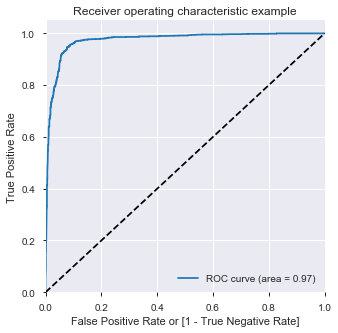

In [2047]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)

### Finding Optimal Cutoff Point

In [2048]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.080076,0,1,0,0,0,0,0,0,0,0,0
1,1,0.920956,1,1,1,1,1,1,1,1,1,1,1
2,1,0.597633,1,1,1,1,1,1,1,0,0,0,0
3,1,0.976503,1,1,1,1,1,1,1,1,1,1,1
4,0,0.006364,0,1,0,0,0,0,0,0,0,0,0


In [2049]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.453581  1.000000  0.000000
0.1   0.1  0.892838  0.977778  0.822330
0.2   0.2  0.916711  0.972515  0.870388
0.3   0.3  0.927056  0.969006  0.892233
0.4   0.4  0.929178  0.959064  0.904369
0.5   0.5  0.931565  0.949123  0.916990
0.6   0.6  0.930504  0.932164  0.929126
0.7   0.7  0.929973  0.911696  0.945146
0.8   0.8  0.892838  0.808187  0.963107
0.9   0.9  0.851724  0.694152  0.982524


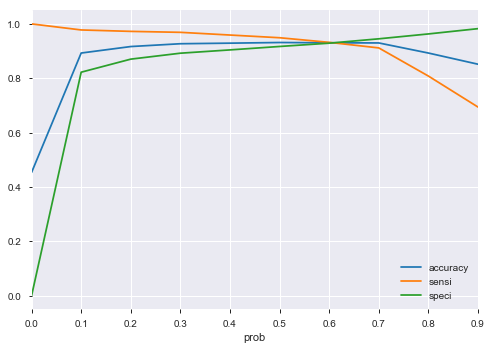

In [2050]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.62 is the optimum point to take it as a cutoff probability.

In [2051]:
y_train_pred_final['final_predicted'] = y_train_pred_final.Converted_Prob.map( lambda x: 1 if x > 0.62 else 0)

y_train_pred_final.head()

,Converted,Converted_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.080076,0,1,0,0,0,0,0,0,0,0,0,0
1,1,0.920956,1,1,1,1,1,1,1,1,1,1,1,1
2,1,0.597633,1,1,1,1,1,1,1,0,0,0,0,0
3,1,0.976503,1,1,1,1,1,1,1,1,1,1,1,1
4,0,0.006364,0,1,0,0,0,0,0,0,0,0,0,0


In [2052]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.final_predicted)

0.9320954907161804

In [2053]:
confusion3 = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.final_predicted )
confusion3

array([[1923,  137],
       [ 119, 1591]], dtype=int64)

### Making predictions on the test set

In [2055]:
# First to fit the new scaler
#scaler_test.fit_transform(X_train[num_cols_test])

X_test[num_cols] = scaler.transform(X_test[num_cols])

X_test.head(5)
#scaler.transform(X_test)

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Index,Asymmetrique Profile Index,email_Yes,call_Yes,Lead_Origin_Landing Page Submission,Lead_Origin_Lead Add Form,Lead_Origin_Lead Import,Free_Copy_Yes,LA_Converted to Lead,LA_Email Bounced,LA_Email Link Clicked,LA_Email Marked Spam,LA_Email Opened,LA_Email Received,LA_Form Submitted on Website,LA_Had a Phone Conversation,LA_Olark Chat Conversation,LA_Page Visited on Website,LA_SMS Sent,LA_Unreachable,LA_Unsubscribed,LA_View in browser link Clicked,LA_Visited Booth in Tradeshow,city_Other Cities,city_Other Cities of Maharashtra,city_Other Metro Cities,city_Select,city_Thane & Outskirts,city_Tier II Cities,LP_Lateral Student,LP_Other Leads,LP_Potential Lead,LP_Select,LP_Student of SomeSchool,LQ_High in Relevance,LQ_Low in Relevance,LQ_Might be,LQ_Not Sure,LQ_Worst,Tags_Busy,Tags_Closed by Horizzon,Tags_Diploma holder (Not Eligible),Tags_Graduation in progress,Tags_In confusion whether part time or DLP,Tags_Interested in full time MBA,Tags_Interested in Next batch,Tags_Interested in other courses,Tags_Lateral student,Tags_Lost to EINS,Tags_Lost to Others,Tags_Not doing further education,Tags_Recognition issue (DEC approval),Tags_Ringing,Tags_Shall take in the next coming month,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,hear_edu_Email,hear_edu_Multiple Sources,hear_edu_Online Search,hear_edu_Other,hear_edu_SMS,hear_edu_Select,hear_edu_Social Media,hear_edu_Student of SomeSchool,hear_edu_Word Of Mouth,curr_ocu_Housewife,curr_ocu_Other,curr_ocu_Student,curr_ocu_Unemployed,curr_ocu_Working Professional,COUN_Bahrain,COUN_Bangladesh,COUN_Canada,COUN_China,COUN_Denmark,COUN_France,COUN_Germany,COUN_Ghana,COUN_Hong Kong,COUN_India,COUN_Indonesia,COUN_Italy,COUN_Kenya,COUN_Kuwait,COUN_Malaysia,COUN_Netherlands,COUN_Nigeria,COUN_Oman,COUN_Philippines,COUN_Qatar,COUN_Saudi Arabia,COUN_Singapore,COUN_South Africa,COUN_Sri Lanka,COUN_Sweden,COUN_Tanzania,COUN_Uganda,COUN_United Arab Emirates,COUN_United Kingdom,COUN_United States,COUN_Vietnam,SPE_Business Administration,SPE_E-Business,SPE_E-COMMERCE,SPE_Finance Management,SPE_Healthcare Management,SPE_Hospitality Management,SPE_Human Resource Management,SPE_IT Projects Management,SPE_International Business,SPE_Marketing Management,SPE_Media and Advertising,SPE_Operations Management,SPE_Retail Management,SPE_Rural and Agribusiness,SPE_Select,SPE_Services Excellence,SPE_Supply Chain Management,SPE_Travel and Tourism,LS_Direct Traffic,LS_Facebook,LS_Google,LS_Live Chat,LS_Olark Chat,LS_Organic Search,LS_Pay per Click Ads,LS_Press_Release,LS_Reference,LS_Referral Sites,LS_Social Media,LS_WeLearn,LS_Welingak Website,LS_bing,LS_testone
5157,0.027027,0.163292,0.133333,2.0,3.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2297,0.027027,0.097711,0.133333,3.0,3.0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7500,0.054054,0.051496,0.266667,3.0,3.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
23,0.054054,0.339349,0.266667,2.0,0.0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0

In [2056]:
X_train.shape

(3770, 132)

In [2057]:
X_test.shape

(1617, 145)

In [2058]:
# Some columns from X_train were dropped along the way
X_test_sm = sm.add_constant(X_test[rfe_retained_col3])

In [2059]:
y_test_pred = res5.predict(X_test_sm)

In [2060]:
y_test_pred[:10]

5157    0.012476
2297    0.006038
7500    0.025266
23      0.028541
5323    0.000046
1493    0.000384
6771    0.187270
517     0.905852
6127    0.925142
532     0.006129
dtype: float64

In [2061]:
type(y_test_pred)

pandas.core.series.Series

In [2062]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [2063]:
y_pred_1.head()

,0
5157,0.012476
2297,0.006038
7500,0.025266
23,0.028541
5323,0.000046


In [2064]:
type(y_test)

pandas.core.series.Series

In [2065]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [2066]:
y_test_df.head(5)

,Converted
5157,0
2297,0
7500,1
23,0
5323,0


In [2067]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [2068]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [2069]:
y_pred_final.head()

,Converted,0
0,0,0.012476
1,0,0.006038
2,1,0.025266
3,0,0.028541
4,0,0.000046


In [2070]:
# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Converted_Prob'})

In [2071]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Converted,Converted_Prob
0,0,0.012476
1,0,0.006038
2,1,0.025266
3,0,0.028541
4,0,0.000046


In [2072]:
y_pred_final['final_predicted'] = y_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.62 else 0)

In [2073]:
y_pred_final.head()

,Converted,Converted_Prob,final_predicted
0,0,0.012476,0
1,0,0.006038,0
2,1,0.025266,0
3,0,0.028541,0
4,0,0.000046,0


In [2074]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_pred_final.Converted, y_pred_final.final_predicted)

0.9264069264069265

In [2075]:
confusion_test = metrics.confusion_matrix(y_pred_final.Converted, y_pred_final.final_predicted )
confusion_test

array([[745,  64],
       [ 55, 753]], dtype=int64)

In [2076]:
TP = confusion_test[1,1] # true positive 
TN = confusion_test[0,0] # true negatives
FP = confusion_test[0,1] # false positives
FN = confusion_test[1,0] # false negatives

In [2077]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.931930693069307

In [2078]:
# Let us calculate specificity
TN / float(TN+FP)

0.9208899876390606

In [2079]:
rfe_retained_col3

['Total Time Spent on Website',
 'email_Yes',
 'LA_Converted to Lead',
 'LA_Olark Chat Conversation',
 'LQ_High in Relevance',
 'LQ_Low in Relevance',
 'LQ_Might be',
 'LQ_Not Sure',
 'Tags_Busy',
 'Tags_Closed by Horizzon',
 'Tags_Graduation in progress',
 'Tags_Interested  in full time MBA',
 'Tags_Interested in other courses',
 'Tags_Lost to EINS',
 'Tags_Not doing further education',
 'Tags_Ringing',
 'Tags_Want to take admission but has financial problems',
 'Tags_in touch with EINS',
 'Tags_invalid number',
 'Tags_opp hangup',
 'Tags_switched off',
 'curr_ocu_Working Professional',
 'LS_Reference']

#### The CEO of X Education had given a ballpark of the target lead conversion rate to be around 80% i.e. the Sensitivity needed to be around 80%. Seeing the above test metrics the Sensitivity achieved with the currrent model i s around 93%. Therefore, the CEO can use the current model for making lead conversion predictions